In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/ic7400/test-video/Compiled_test_video.mp4
/kaggle/input/models/ic7400/model1/onnx/default/1/best_model.onnx


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.9/276.9 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 118.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 103.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.


Extracting Dataset Version Zip to Multiclass-Missile-2 in yolov8:: 100%|██████████| 10657/10657 [00:01<00:00, 10014.05it/s]


Dataset at: /kaggle/working/Multiclass-Missile-2
Contents: [PosixPath('/kaggle/working/Multiclass-Missile-2/data.yaml'), PosixPath('/kaggle/working/Multiclass-Missile-2/README.dataset.txt'), PosixPath('/kaggle/working/Multiclass-Missile-2/valid'), PosixPath('/kaggle/working/Multiclass-Missile-2/README.roboflow.txt'), PosixPath('/kaggle/working/Multiclass-Missile-2/train'), PosixPath('/kaggle/working/Multiclass-Missile-2/test')]
Classes (5): ['Missile', 'airplane', 'bird', 'drone', 'helicopter']
Missile class index: 0

📊 DATASET AUDIT (per class):

TRAIN  |  total images: 4285  |  background: 10
    Missile      instances: 824    images containing it: 724
    airplane     instances: 980    images containing it: 582
    bird         instances: 1290   images containing it: 689
    drone        instances: 1210   images containing it: 983
    helicopter   instances: 1660   images containing it: 1309

VALID  |  total images: 483  |  background: 3
    Missile      instances: 53     images con

Argument(s) 'var_limit' are not valid for transform GaussNoise
Argument(s) 'value' are not valid for transform PadIfNeeded
ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
Argument(s) 'var_limit' are not valid for transform GaussNoise
Argument(s) 'value' are not valid for transform PadIfNeeded



Processing /kaggle/working/Multiclass-Missile-2/train → light preprocessing pass on 4285 images...
  ✅ Light preprocessing done: 4285 images
  Missile instances found: 824
  Source images containing missile: 724
  Topping up missile: need 376 more instances...
    Missile instances so far: 880/1200
    Missile instances so far: 942/1200
    Missile instances so far: 997/1200
    Missile instances so far: 1058/1200
    Missile instances so far: 1118/1200
    Missile instances so far: 1171/1200
  ✅ Missile top-up done: 1201 instances
✅ Copied valid as-is (no augmentation on eval sets)
✅ Copied test as-is (no augmentation on eval sets)

POST-PROCESSING AUDIT

📊 DATASET AUDIT (per class):

TRAIN  |  total images: 4612  |  background: 17
    Missile      instances: 1201   images containing it: 1051
    airplane     instances: 982    images containing it: 584
    bird         instances: 1290   images containing it: 689
    drone        instances: 1210   images containing it: 983
    helicop

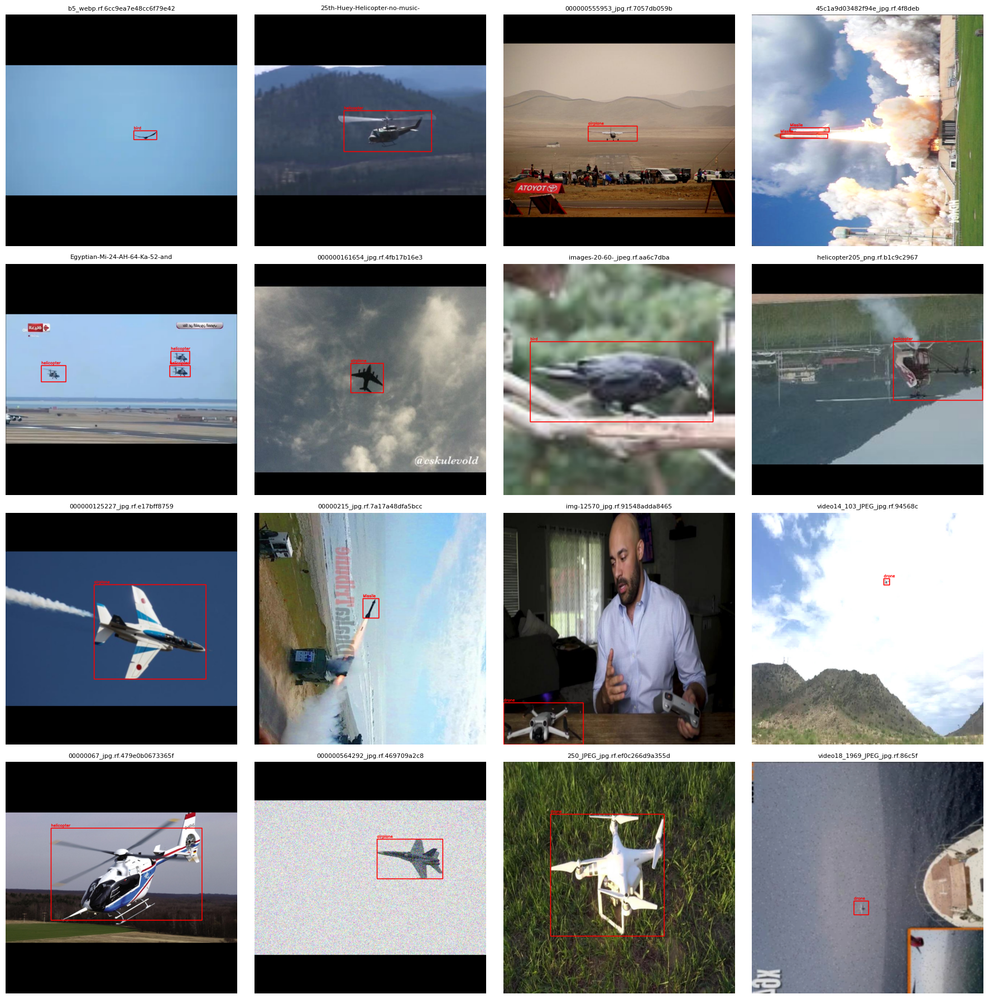

Saved /kaggle/working/sanity_check_general.png


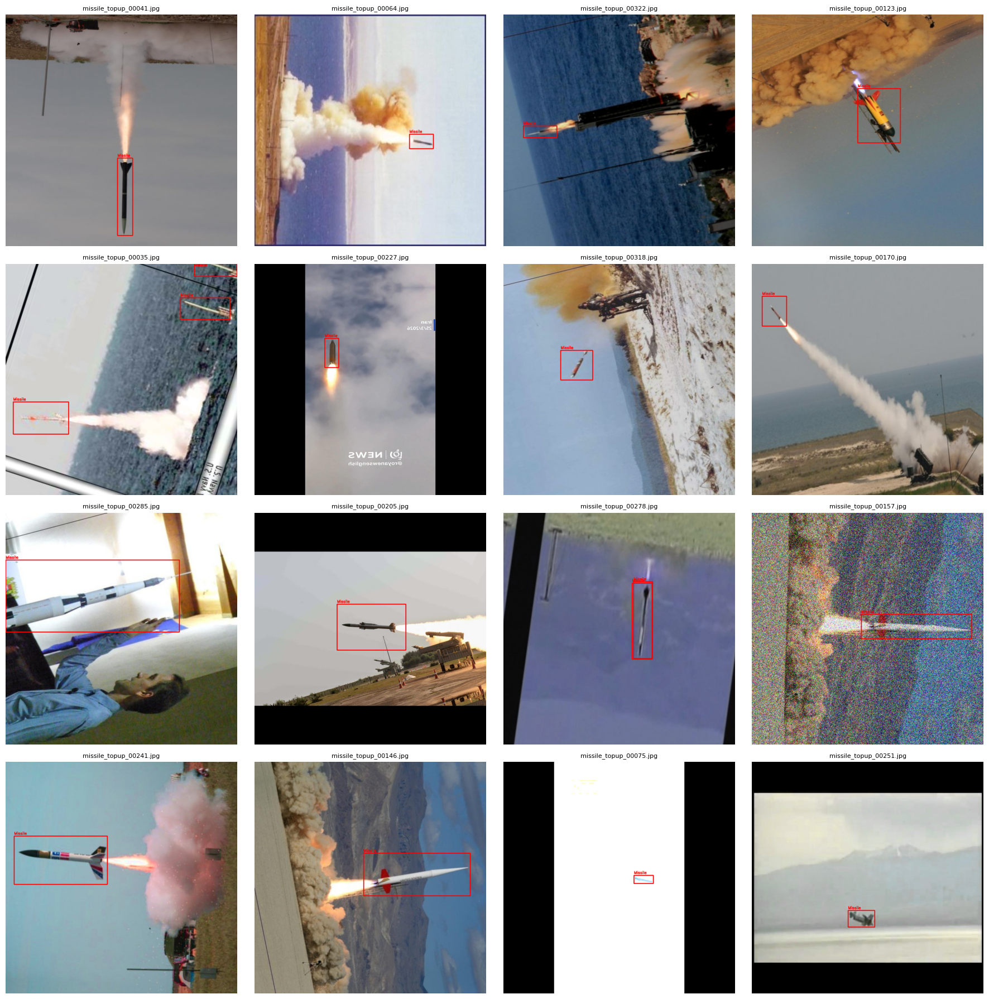

Saved /kaggle/working/sanity_check_missile.png


In [2]:
!pip install ultralytics roboflow albumentations opencv-python-headless -q
!pip install supervision -q 

import os, shutil, random, yaml, cv2
import numpy as np
from pathlib import Path
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import albumentations as A
from ultralytics import YOLO
import supervision as sv

random.seed(42)
np.random.seed(42)

from roboflow import Roboflow
rf = Roboflow(api_key="M5l44TUoXaMmGZIAD6HS")
project = rf.workspace("nandini-verma-pjadq").project("multiclass-missile")
version = project.version(2)
dataset = version.download("yolov8")

DATASET_DIR = Path(dataset.location)
print(f"Dataset at: {DATASET_DIR}")
print("Contents:", list(DATASET_DIR.iterdir()))

with open(DATASET_DIR / 'data.yaml', 'r') as f:
    original_yaml = yaml.safe_load(f)
CLASS_NAMES = original_yaml['names']
NUM_CLASSES = original_yaml['nc']
print(f"Classes ({NUM_CLASSES}): {CLASS_NAMES}")

MISSILE_IDX = None
for i, name in enumerate(CLASS_NAMES):
    if 'missile' in name.lower():
        MISSILE_IDX = i
        break
assert MISSILE_IDX is not None, "Couldn't find 'missile' class in names — check spelling in Roboflow"
print(f"Missile class index: {MISSILE_IDX}")


def audit_dataset(dataset_dir, class_names):
    """Per-class instance counts across splits — critical for spotting imbalance."""
    stats = {}
    for split in ['train', 'valid', 'test']:
        img_dir = dataset_dir / split / 'images'
        lbl_dir = dataset_dir / split / 'labels'
        if not img_dir.exists():
            continue

        images = list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.png'))
        labels = list(lbl_dir.glob('*.txt')) if lbl_dir.exists() else []

        class_instance_counts = Counter()
        images_per_class = defaultdict(set)  # unique images containing each class
        background_count = 0

        for lbl in labels:
            content = lbl.read_text().strip()
            if not content:
                background_count += 1
                continue
            for line in content.split('\n'):
                parts = line.strip().split()
                if len(parts) == 5:
                    cls_id = int(float(parts[0]))
                    class_instance_counts[cls_id] += 1
                    images_per_class[cls_id].add(lbl.stem)

        stats[split] = {
            'images': len(images),
            'background': background_count,
            'instances_per_class': {class_names[k]: v for k, v in class_instance_counts.items()},
            'images_per_class': {class_names[k]: len(v) for k, v in images_per_class.items()},
        }

    print("\n📊 DATASET AUDIT (per class):")
    print("=" * 60)
    for split, s in stats.items():
        print(f"\n{split.upper()}  |  total images: {s['images']}  |  background: {s['background']}")
        for cname in class_names:
            inst = s['instances_per_class'].get(cname, 0)
            imgs = s['images_per_class'].get(cname, 0)
            print(f"    {cname:<12} instances: {inst:<5}  images containing it: {imgs}")
    return stats

stats = audit_dataset(DATASET_DIR, CLASS_NAMES)


def get_light_preprocessing_pipeline(image_size=1280):
    """
    Light, uniform preprocessing for all 5 classes.
    Intentionally mild — these are real, mature class sizes (900-1000
    instances each), they don't need heavy augmentation, just realistic
    sensor/lighting variance and resolution standardization.
    """
    return A.Compose([
        A.HorizontalFlip(p=0.5),

        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2),
            A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=15),
        ], p=0.5),

        A.OneOf([
            A.GaussNoise(var_limit=(5.0, 15.0)),       # mild sensor noise only
            A.GaussianBlur(blur_limit=(3, 5)),          # mild defocus only
        ], p=0.25),

        # Aspect-ratio preserving resize + pad (important for thin objects
        # like missiles AND for birds/drones which can also be small/elongated)
        A.LongestMaxSize(max_size=image_size),
        A.PadIfNeeded(min_height=image_size, min_width=image_size,
                      border_mode=cv2.BORDER_CONSTANT, value=(114, 114, 114)),
    ], bbox_params=A.BboxParams(
        format='yolo',
        label_fields=['class_labels'],
        min_visibility=0.3,
        filter_invalid_bboxes=True
    ))



def get_missile_topup_pipeline(image_size):
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=25, border_mode=cv2.BORDER_REFLECT_101, p=0.5),   # extra: missiles fly at angles
        A.ShiftScaleRotate(shift_limit=0.08, scale_limit=0.2, rotate_limit=15,
                            border_mode=cv2.BORDER_REFLECT_101, p=0.4),   # extra: viewpoint variety

        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2),
            A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=15),
        ], p=0.5),

        A.OneOf([
            A.GaussNoise(var_limit=(5.0, 15.0)),
            A.GaussianBlur(blur_limit=(3, 5)),
        ], p=0.25),

        A.LongestMaxSize(max_size=image_size),
        A.PadIfNeeded(min_height=image_size, min_width=image_size,
                      border_mode=cv2.BORDER_CONSTANT, value=(114, 114, 114)),
    ], bbox_params=A.BboxParams(
        format='yolo',
        label_fields=['class_labels'],
        min_visibility=0.3,
        filter_invalid_bboxes=True
    ))


def process_dataset(split_dir, output_dir, image_size, class_names, missile_idx,
                     missile_target_instances=1000):
    """
    1. Applies light preprocessing to every image (saved once each — not
       inflating dataset size, just standardizing/lightly varying it).
    2. Tops up ONLY missile instances via additional augmented copies,
       sampled from images that already contain a missile, until the
       missile instance count reaches missile_target_instances.
    """
    img_dir = Path(split_dir) / 'images'
    lbl_dir = Path(split_dir) / 'labels'
    out_img_dir = Path(output_dir) / 'images'
    out_lbl_dir = Path(output_dir) / 'labels'
    out_img_dir.mkdir(parents=True, exist_ok=True)
    out_lbl_dir.mkdir(parents=True, exist_ok=True)

    light_pipeline = get_light_preprocessing_pipeline(image_size)
    missile_pipeline = get_missile_topup_pipeline(image_size)

    images = list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.png'))
    missile_source_images = []   # (img_path, lbl_path) pairs that contain a missile
    current_missile_instances = 0

    print(f"\nProcessing {split_dir} → light preprocessing pass on {len(images)} images...")

    # ── Pass 1: light preprocessing applied once to every image ──
    for img_path in images:
        lbl_path = lbl_dir / (img_path.stem + '.txt')

        image = cv2.imread(str(img_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        bboxes, class_labels = [], []
        has_missile = False
        if lbl_path.exists():
            content = lbl_path.read_text().strip()
            if content:
                for line in content.split('\n'):
                    parts = line.strip().split()
                    if len(parts) == 5:
                        cls_id = int(parts[0])
                        class_labels.append(cls_id)
                        bboxes.append([float(p) for p in parts[1:]])
                        if cls_id == missile_idx:
                            has_missile = True
                            current_missile_instances += 1

        try:
            augmented = light_pipeline(image=image, bboxes=bboxes, class_labels=class_labels)
        except Exception as e:
            print(f"  ⚠️ Skipped {img_path.name}: {e}")
            continue

        out_name = img_path.stem
        cv2.imwrite(str(out_img_dir / f"{out_name}.jpg"),
                    cv2.cvtColor(augmented['image'], cv2.COLOR_RGB2BGR),
                    [cv2.IMWRITE_JPEG_QUALITY, 95])

        with open(out_lbl_dir / f"{out_name}.txt", 'w') as f:
            for cls, bbox in zip(augmented['class_labels'], augmented['bboxes']):
                cx, cy, bw, bh = bbox
                cx = max(0.001, min(0.999, cx)); cy = max(0.001, min(0.999, cy))
                bw = max(0.001, min(0.999, bw)); bh = max(0.001, min(0.999, bh))
                f.write(f"{int(cls)} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}\n")

        if has_missile:
            missile_source_images.append((img_path, lbl_path))

    print(f"  ✅ Light preprocessing done: {len(images)} images")
    print(f"  Missile instances found: {current_missile_instances}")
    print(f"  Source images containing missile: {len(missile_source_images)}")

    if current_missile_instances >= missile_target_instances:
        print(f"  Missile already at/above target ({missile_target_instances}), no top-up needed.")
        return

    if not missile_source_images:
        print("  ⚠️ No missile source images found — cannot top up. Check MISSILE_IDX / labels.")
        return

    aug_idx = 0
    needed = missile_target_instances - current_missile_instances
    print(f"  Topping up missile: need {needed} more instances...")

    while current_missile_instances < missile_target_instances:
        img_path, lbl_path = random.choice(missile_source_images)

        image = cv2.imread(str(img_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        bboxes, class_labels = [], []
        content = lbl_path.read_text().strip()
        for line in content.split('\n'):
            parts = line.strip().split()
            if len(parts) == 5:
                class_labels.append(int(parts[0]))
                bboxes.append([float(p) for p in parts[1:]])

        try:
            augmented = missile_pipeline(image=image, bboxes=bboxes, class_labels=class_labels)
        except Exception:
            continue

        if missile_idx not in augmented['class_labels']:
            # bbox may have been dropped (min_visibility) after rotation/crop — skip this draw
            continue

        aug_name = f"missile_topup_{aug_idx:05d}"
        cv2.imwrite(str(out_img_dir / f"{aug_name}.jpg"),
                    cv2.cvtColor(augmented['image'], cv2.COLOR_RGB2BGR),
                    [cv2.IMWRITE_JPEG_QUALITY, 95])

        with open(out_lbl_dir / f"{aug_name}.txt", 'w') as f:
            for cls, bbox in zip(augmented['class_labels'], augmented['bboxes']):
                cx, cy, bw, bh = bbox
                cx = max(0.001, min(0.999, cx)); cy = max(0.001, min(0.999, cy))
                bw = max(0.001, min(0.999, bw)); bh = max(0.001, min(0.999, bh))
                f.write(f"{int(cls)} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}\n")
                if cls == missile_idx:
                    current_missile_instances += 1

        aug_idx += 1

        if aug_idx % 50 == 0:
            print(f"    Missile instances so far: {current_missile_instances}/{missile_target_instances}")

    print(f"  ✅ Missile top-up done: {current_missile_instances} instances")


# ── 6. RUN PREPROCESSING ──────────────────────────────────────
PROCESSED_DIR = Path('/kaggle/tmp/aerial_processed')   # /kaggle/tmp avoids the
                                                         # 500-file output-dataset
                                                         # cap discussed earlier
IMAGE_SIZE = 1280

# Train: light preprocessing + missile top-up to 1000 instances
process_dataset(
    str(DATASET_DIR / 'train'),
    str(PROCESSED_DIR / 'train'),
    image_size=IMAGE_SIZE,
    class_names=CLASS_NAMES,
    missile_idx=MISSILE_IDX,
    missile_target_instances=1200,
)

# Val/test: NEVER augment or top-up eval sets — copy as-is.
# (If you want consistent resolution at eval time too, that's handled
# automatically by YOLO's letterbox resize at inference/val anyway.)
for split in ['valid', 'test']:
    src = DATASET_DIR / split
    dst = PROCESSED_DIR / split
    if src.exists():
        shutil.copytree(src, dst, dirs_exist_ok=True)
        print(f"✅ Copied {split} as-is (no augmentation on eval sets)")

# Re-audit to confirm the top-up worked as intended
print("\n" + "=" * 60)
print("POST-PROCESSING AUDIT")
audit_dataset(PROCESSED_DIR, CLASS_NAMES)


# ── 7. CREATE data.yaml ────────────────────────────────────────
data_config = {
    'path': str(PROCESSED_DIR),
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'nc': NUM_CLASSES,
    'names': CLASS_NAMES,
}

yaml_path = PROCESSED_DIR / 'data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_config, f, default_flow_style=False)

print(f"\n📄 data.yaml written to {yaml_path}")
print(yaml.dump(data_config))

def sanity_check_grid(processed_dir, class_names, split='train', n=16, missile_only=False):
    img_dir = Path(processed_dir) / split / 'images'
    lbl_dir = Path(processed_dir) / split / 'labels'
    images = list(img_dir.glob('*.jpg'))

    if missile_only:
        images = [p for p in images if 'missile_topup' in p.stem]

    samples = random.sample(images, min(n, len(images)))
    fig, axes = plt.subplots(4, 4, figsize=(18, 18))
    for ax, img_path in zip(axes.flatten(), samples):
        img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if lbl_path.exists():
            for line in lbl_path.read_text().strip().split('\n'):
                if not line:
                    continue
                parts = line.split()
                cls_id = int(float(parts[0]))
                cx, cy, bw, bh = [float(p) for p in parts[1:]]
                x1, y1 = int((cx - bw/2) * w), int((cy - bh/2) * h)
                x2, y2 = int((cx + bw/2) * w), int((cy + bh/2) * h)
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 3)
                cv2.putText(img, class_names[cls_id], (x1, max(15, y1 - 8)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
        ax.imshow(img)
        ax.set_title(img_path.name[:30], fontsize=8)
        ax.axis('off')
    plt.tight_layout()
    fname = f'/kaggle/working/sanity_check_{"missile" if missile_only else "general"}.png'
    plt.savefig(fname, dpi=100)
    plt.show()
    print(f"Saved {fname}")

sanity_check_grid(PROCESSED_DIR, CLASS_NAMES, split='train', n=16, missile_only=False)
sanity_check_grid(PROCESSED_DIR, CLASS_NAMES, split='train', n=16, missile_only=True)

WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in the future.
Ultralytics 8.4.92 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=20, cls=0.6, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.15, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/tmp/aerial_processed/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.1, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.01, hsv_s=0.5, hsv_v=0.3, imgsz=1280, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, 

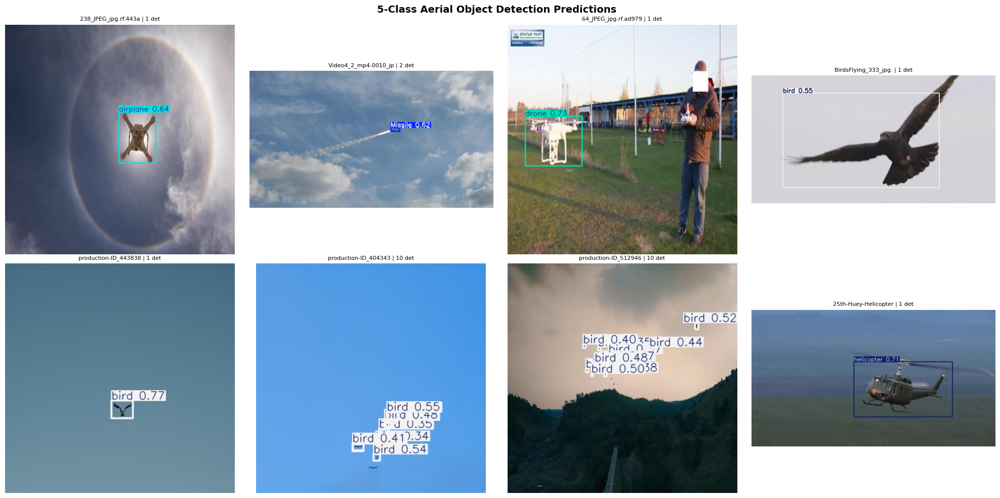

Ultralytics 8.4.92 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/kaggle/working/runs/aerial_yolov8n_5class/weights/best.pt' with input shape (1, 3, 1280, 1280) BCHW and output shape(s) (1, 9, 33600) (6.0 MB)
requirements: Ultralytics requirements ['onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 389ms
 Downloaded onnxruntime
Prepared 2 packages in 371ms
Installed 2 packages in 13ms
 + onnxruntime==1.27.0
 + onnxslim==0.1.94

requirements: AutoUpdate success ✅ 1.3s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.21.0 opset 20...
ONNX: slimming with onnxslim 0.1.94...
ONNX: export success ✅ 3.2s, saved as '/kaggle/working/runs/aerial_yolov8n_5c

In [3]:
# ── 9. YOLOv8n TRAINING ─────────────────────────────────────────
model = YOLO('yolov8n.pt')

results = model.train(
    data=str(yaml_path),

    # ── Core ──────────────────────────────────────────────
    epochs=150,
    imgsz=IMAGE_SIZE,         # 1280, as requested
    batch=4,                  # 1280px is memory-heavy; drop to 4 if OOM on T4

    # ── On-the-fly augmentation (light — your data is preprocessed already) ──
    mosaic=1.0,                # keep on, helps multi-class context mixing
    copy_paste=0.15,           # light — was 0.4 for single-class; too high here risks
                                # pasting objects with mismatched lighting across 5 classes
    scale=0.4,
    fliplr=0.5,
    hsv_h=0.01,                 # lighter than before — avoid double-stacking with your
    hsv_s=0.5,                  # Albumentations preprocessing pass
    hsv_v=0.3,
    translate=0.1,

    close_mosaic=20,            # stabilize detection head in final epochs

    # ── Optimizer ─────────────────────────────────────────
    optimizer='AdamW',
    lr0=0.001,
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=5,
    warmup_momentum=0.8,

    # ── Loss weights — IMPORTANT CHANGE for 5-class problem ──
    box=7.5,                    # back to default-ish; localization still matters
                                 # but isn't your only concern anymore
    cls=0.6,                    # back to NORMAL — multi-class confusion is real now
                                 # (bird vs drone vs missile silhouettes can be ambiguous)
    dfl=1.5,

    dropout=0.1,
    label_smoothing=0.05,

    patience=30,
    save_period=10,
    val=True,
    plots=True,
    seed=42,

    project='/kaggle/working/runs',
    name='aerial_yolov8n_5class',
    exist_ok=True,

    pretrained=True,
    multi_scale=False,
)

print("\n✅ Training complete!")
print(f"Best mAP50: {results.results_dict.get('metrics/mAP50(B)', 'N/A')}")


# ── 10. EVALUATION (per-class, not just aggregate) ─────────────
best_model = YOLO('/kaggle/working/runs/aerial_yolov8n_5class/weights/best.pt')

test_results = best_model.val(
    data=str(yaml_path),
    split='test',
    imgsz=IMAGE_SIZE,
    conf=0.25,
    iou=0.5,
    plots=True,
    save_json=True,
)

print("\n📊 TEST SET RESULTS (aggregate):")
print(f"  mAP50:    {test_results.results_dict.get('metrics/mAP50(B)', 0):.4f}")
print(f"  mAP50-95: {test_results.results_dict.get('metrics/mAP50-95(B)', 0):.4f}")
print(f"  Precision:{test_results.results_dict.get('metrics/precision(B)', 0):.4f}")
print(f"  Recall:   {test_results.results_dict.get('metrics/recall(B)', 0):.4f}")

print("\n📊 PER-CLASS mAP50:")
if hasattr(test_results, 'box') and hasattr(test_results.box, 'maps'):
    for i, cname in enumerate(CLASS_NAMES):
        print(f"  {cname:<12}: {test_results.box.maps[i]:.4f}")


# ── 11. INFERENCE VISUALIZATION ─────────────────────────────────
def visualize_predictions(model, dataset_dir, class_names, split='test', n_samples=8, conf=0.25):
    img_dir = Path(dataset_dir) / split / 'images'
    images = list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.png'))
    samples = random.sample(images, min(n_samples, len(images)))

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.flatten()

    for ax, img_path in zip(axes, samples):
        results = model(str(img_path), conf=conf, verbose=False)
        annotated = results[0].plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
        n_det = len(results[0].boxes)
        ax.set_title(f"{img_path.name[:20]} | {n_det} det", fontsize=8)
        ax.axis('off')

    plt.suptitle('5-Class Aerial Object Detection Predictions', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('/kaggle/working/predictions_grid.png', dpi=150, bbox_inches='tight')
    plt.show()

visualize_predictions(best_model, PROCESSED_DIR, CLASS_NAMES, split='test', conf=0.3)


best_model.export(format='onnx', imgsz=IMAGE_SIZE, simplify=True, dynamic=False)
print("✅ Exported to ONNX")

In [4]:
model = YOLO("/kaggle/input/models/ic7400/model1/onnx/default/1/best_model.onnx", task="detect")
model.predict(source="/kaggle/input/datasets/ic7400/test-video/Compiled_test_video.mp4", show=True, save=True, conf=0.25)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Loading /kaggle/input/models/ic7400/model1/onnx/default/1/best_model.onnx for ONNX Runtime inference...
requirements: Ultralytics requirement ['onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 5 packages in 240ms
 Downloaded onnxruntime-gpu
Prepared 1 package in 2.13s
Installed 1 package in 97ms
 + onnxruntime-gpu==1.27.0

requirements: AutoUpdate success ✅ 2.6s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

WARNING ⚠️ CUDA requested but CUDAExecutionProvider not available. Using CPU...
Using ONNX Runtime 1.27.0 with CPUExecutionProvider

WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=Tru

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Missile', 1: 'airplane', 2: 'bird', 3: 'drone', 4: 'helicopter'}
 obb: None
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
 